In [ ]:
from fastai.vision.all import *
from fastai.vision.widgets import *
from fastai.metrics import error_rate, accuracy

In [ ]:
CONST_DATA_PATH = "/content/drive/MyDrive/Colab Notebooks/fastai/garbage_classification"
CONST_PATH = Path(CONST_DATA_PATH)

In [ ]:
failed = verify_images(get_image_files(CONST_PATH))
failed

(#0) []

In [ ]:
dls = DataBlock(

    blocks = [ImageBlock, CategoryBlock],
    get_items = get_image_files,
    splitter = RandomSplitter(),
    get_y = parent_label,
    item_tfms = [RandomResizedCrop(224, min_scale=.3)],
    batch_tfms = aug_transforms(mult=2)
    
).dataloaders(CONST_PATH)

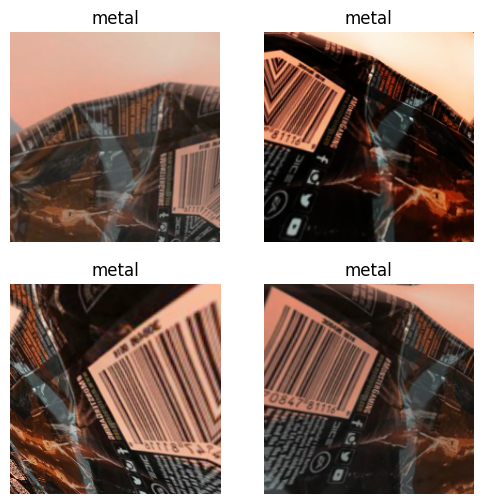

In [ ]:
dls.show_batch(max_n=4, unique=True)

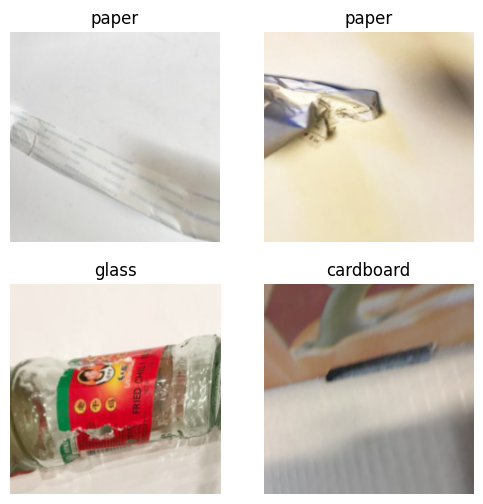

In [ ]:
dls.show_batch(max_n=4)

In [ ]:
learn = cnn_learner(dls, resnet50, metrics=[error_rate, accuracy])
learn.fine_tune(5)

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.535276,0.549068,0.155819,0.844181,00:22


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.875657,0.340422,0.120316,0.879684,00:26
1,0.681227,0.414700,0.126233,0.873767,00:25
2,0.550647,0.280329,0.084813,0.915187,00:26
3,0.421711,0.218395,0.069034,0.930966,00:26
4,0.327061,0.206392,0.063116,0.936884,00:26


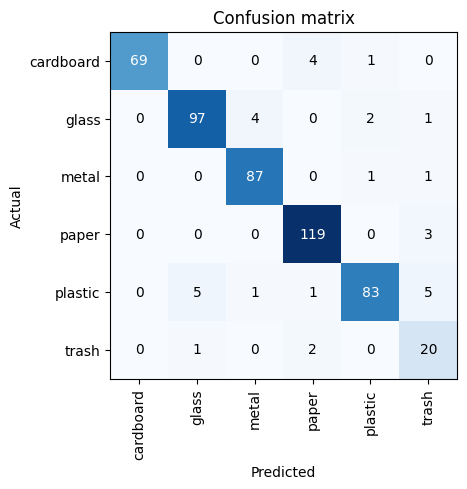

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

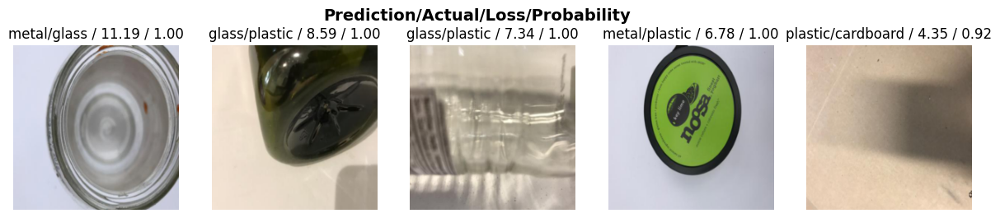

In [ ]:
interp.plot_top_losses(5, nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx, cat in cleaner.change() : shutil.move(str(cleaner.fns[idx]), CONST_PATH/cat)